In [70]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns

# Read data and generate data frame

In [71]:
df = pd.read_csv("AB_NYC_2019.csv")

In [72]:
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


# Part1: Data Cleaning

## Check how many samples in total and how many sample is empty

In [73]:
df.shape

(48895, 16)

In [74]:
df.isnull().any() # check whcih column has null value

id                                False
name                               True
host_id                           False
host_name                          True
neighbourhood_group               False
neighbourhood                     False
latitude                          False
longitude                         False
room_type                         False
price                             False
minimum_nights                    False
number_of_reviews                 False
last_review                        True
reviews_per_month                  True
calculated_host_listings_count    False
availability_365                  False
dtype: bool

In [75]:
df.loc[df['number_of_reviews']<=0,"reviews_per_month"] = 0
df.loc[df['number_of_reviews']<=0,"last_review"] = "None"
df

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,None,0.00,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48890,36484665,Charming one bedroom - newly renovated rowhouse,8232441,Sabrina,Brooklyn,Bedford-Stuyvesant,40.67853,-73.94995,Private room,70,2,0,None,0.00,2,9
48891,36485057,Affordable room in Bushwick/East Williamsburg,6570630,Marisol,Brooklyn,Bushwick,40.70184,-73.93317,Private room,40,4,0,None,0.00,2,36
48892,36485431,Sunny Studio at Historical Neighborhood,23492952,Ilgar & Aysel,Manhattan,Harlem,40.81475,-73.94867,Entire home/apt,115,10,0,None,0.00,1,27
48893,36485609,43rd St. Time Square-cozy single bed,30985759,Taz,Manhattan,Hell's Kitchen,40.75751,-73.99112,Shared room,55,1,0,None,0.00,6,2


some user/host don't have name and some houses are never viewed. It's impossible to fill names, drop them. Fill no visited samples last_review and reviews_per_month to "None" and 0

In [76]:
df.dropna(inplace = True)

In [77]:
df.shape

(48858, 16)

Now we can keep interesting samples and also drop those that can't fix

## Check how many samples are duplicate

In [78]:
df.drop_duplicates() # There are no complete duplicate samples

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,None,0.00,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48890,36484665,Charming one bedroom - newly renovated rowhouse,8232441,Sabrina,Brooklyn,Bedford-Stuyvesant,40.67853,-73.94995,Private room,70,2,0,None,0.00,2,9
48891,36485057,Affordable room in Bushwick/East Williamsburg,6570630,Marisol,Brooklyn,Bushwick,40.70184,-73.93317,Private room,40,4,0,None,0.00,2,36
48892,36485431,Sunny Studio at Historical Neighborhood,23492952,Ilgar & Aysel,Manhattan,Harlem,40.81475,-73.94867,Entire home/apt,115,10,0,None,0.00,1,27
48893,36485609,43rd St. Time Square-cozy single bed,30985759,Taz,Manhattan,Hell's Kitchen,40.75751,-73.99112,Shared room,55,1,0,None,0.00,6,2


### See how many outliers by using +-3 sigma on 'price'

Due to normal expression, 99.73% of datas will lie between mean+-3*std. We will define any data['price'] that lie outside this range as outlier

In [79]:
# define a expression that check how many outliers are there
min_range = df['price'] < (df['price'].mean()-3*df['price'].std())
max_range = df['price'] > (df['price'].mean()+3*df['price'].std())
expression = min_range | max_range
df.loc[expression,'price'] # see how many samples are there

496      2000
762      1300
946      3000
1105     1300
1414     1000
         ... 
48301     999
48304    2999
48305    1999
48523    1369
48535    1749
Name: price, Length: 388, dtype: int64

In [80]:
df.loc[expression,'price'].describe()

count      388.000000
mean      1899.695876
std       1659.006591
min        875.000000
25%       1000.000000
50%       1200.000000
75%       2000.000000
max      10000.000000
Name: price, dtype: float64

Let's see what normal Outlier gives us

In [81]:
iqr = df['price'].quantile(0.75) - df['price'].quantile(0.25)
min_out = df['price'] < (df['price'].quantile(0.25)-1.5*iqr)
max_out = df['price'] > (df['price'].quantile(0.75)+1.5*iqr)
out_exp = min_out | max_out
df.loc[out_exp,'price']

61       375
85       800
103      500
114      350
121      400
        ... 
48758    350
48833    475
48839    800
48842    350
48856    345
Name: price, Length: 2971, dtype: int64

In [82]:
df.loc[out_exp,'price'].describe()

count     2971.000000
mean       658.862673
std        777.677679
min        335.000000
25%        380.000000
50%        450.000000
75%        650.000000
max      10000.000000
Name: price, dtype: float64

Notmal outlier gives us more samples and those samples' price look relatively 'normal', so we will use +-3sigma to remove outliers
See the description of two outlier sets. We can see that normal outlier (1.5 iqr) have relative low min (335). Since we are talking about renting a place in NY, I believe 335 will be consider as normal price.

In [83]:
# define opposite expression (see conditions)
min_range = df['price'] > (df['price'].mean()-3*df['price'].std())
max_range = df['price'] < (df['price'].mean()+3*df['price'].std())
expression = min_range & max_range
df = df.loc[expression,:] # change df
df # show df

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,None,0.00,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48890,36484665,Charming one bedroom - newly renovated rowhouse,8232441,Sabrina,Brooklyn,Bedford-Stuyvesant,40.67853,-73.94995,Private room,70,2,0,None,0.00,2,9
48891,36485057,Affordable room in Bushwick/East Williamsburg,6570630,Marisol,Brooklyn,Bushwick,40.70184,-73.93317,Private room,40,4,0,None,0.00,2,36
48892,36485431,Sunny Studio at Historical Neighborhood,23492952,Ilgar & Aysel,Manhattan,Harlem,40.81475,-73.94867,Entire home/apt,115,10,0,None,0.00,1,27
48893,36485609,43rd St. Time Square-cozy single bed,30985759,Taz,Manhattan,Hell's Kitchen,40.75751,-73.99112,Shared room,55,1,0,None,0.00,6,2


### Done Cleaning

My idea of data cleaning is to drop as few information as possible so we don't lost something interesting

# Part 2: Price vs. Neighborhood

## a. Get Top and Bot 5

### Overall Neighborhood

Delete neighbors that less than 5 listing

In [84]:
# get all neighbourhood that appear more than 5 times
counts = df['neighbourhood'].value_counts()
counts = list(counts[counts>=5].index)
counts[:5]

['Williamsburg', 'Bedford-Stuyvesant', 'Harlem', 'Bushwick', "Hell's Kitchen"]

In [85]:
# get samples if it's neighbourhood is in above frequency list
frequent = df.loc[(df['neighbourhood'].isin(counts)),:]
frequent

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,None,0.00,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48890,36484665,Charming one bedroom - newly renovated rowhouse,8232441,Sabrina,Brooklyn,Bedford-Stuyvesant,40.67853,-73.94995,Private room,70,2,0,None,0.00,2,9
48891,36485057,Affordable room in Bushwick/East Williamsburg,6570630,Marisol,Brooklyn,Bushwick,40.70184,-73.93317,Private room,40,4,0,None,0.00,2,36
48892,36485431,Sunny Studio at Historical Neighborhood,23492952,Ilgar & Aysel,Manhattan,Harlem,40.81475,-73.94867,Entire home/apt,115,10,0,None,0.00,1,27
48893,36485609,43rd St. Time Square-cozy single bed,30985759,Taz,Manhattan,Hell's Kitchen,40.75751,-73.99112,Shared room,55,1,0,None,0.00,6,2


### In Each Neighborhood Group

We are going to find top/bottom 5 on 5 groups

In [86]:
frequent['neighbourhood_group'].value_counts() # see how many sample are there in one group

Manhattan        21360
Brooklyn         20001
Queens            5638
Bronx             1075
Staten Island      330
Name: neighbourhood_group, dtype: int64

In [87]:
# split each group
group1 = frequent.loc[df['neighbourhood_group']=='Manhattan']
group2 = frequent.loc[df['neighbourhood_group']=='Brooklyn']
group3 = frequent.loc[df['neighbourhood_group']=='Queens']
group4 = frequent.loc[df['neighbourhood_group']=='Bronx']
group5 = frequent.loc[df['neighbourhood_group']=='Staten Island']

#### Top and bottom 5 of Manhattan

In [88]:
group1.sort_values(by='price',ascending=False).head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
5351,3861943,Spacious Studio in Time Square,14733148,Susan,Manhattan,Hell's Kitchen,40.76052,-73.99115,Entire home/apt,860,4,39,2016-08-17,0.67,1,365
29994,23091139,Luxurious Private West Village TownHome,66230837,Jason,Manhattan,West Village,40.73143,-74.00338,Entire home/apt,850,3,27,2019-02-25,1.57,1,344
3597,2150328,"SUPERBOWL!! 2 Bd, 2 Ba w Roof Deck!",10974237,Abby,Manhattan,East Village,40.72767,-73.98825,Entire home/apt,850,1,0,None,0.00,1,0
32938,25970826,"$6M Soho Penthouse: 2000 sq ft, 18 ft ceilings",1001819,Rose,Manhattan,Greenwich Village,40.72818,-73.99993,Entire home/apt,850,5,11,2019-06-13,0.88,1,45
27600,21709727,DESIGNER TOWNHOUSE IN HARLEM,271527,Richard,Manhattan,Harlem,40.81023,-73.94142,Entire home/apt,850,3,4,2018-11-24,0.22,2,178


In [89]:
group1.sort_values(by='price',ascending=False).tail()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
2860,1620248,Large furnished 2 bedrooms- - 30 days Minimum,2196224,Sally,Manhattan,East Village,40.73051,-73.98140,Entire home/apt,10,30,0,None,0.00,4,137
24100,19415314,"Girls only, cozy room one block from Times Square",47336995,Mario,Manhattan,Hell's Kitchen,40.75812,-73.98935,Shared room,10,1,2,2017-06-24,0.08,1,0
31407,24412104,Cozy feel at home studio,91034542,Maureen,Manhattan,Kips Bay,40.74408,-73.97803,Private room,10,5,42,2019-06-30,2.87,1,2
31066,24114389,"Very Spacious bedroom, steps from CENTRAL PARK.",180661875,Salim,Manhattan,Upper West Side,40.76844,-73.98333,Private room,10,1,2,2018-04-23,0.13,1,0
26259,20933849,the best you can find,13709292,Qiuchi,Manhattan,Murray Hill,40.75091,-73.97597,Entire home/apt,0,3,0,None,0.00,1,0


#### Top and bottom 5 of Brooklyn

In [90]:
group2.sort_values(by='price',ascending=False).head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
37341,29650402,Landmarked Limestone Sanctuary,68198631,Kate,Brooklyn,Prospect-Lefferts Gardens,40.66354,-73.95507,Entire home/apt,860,2,4,2019-04-28,0.49,1,23
45627,34866682,New 9 Bed 4 Full Bath 3000 SF Spacious Apartment,262657892,Philip,Brooklyn,Crown Heights,40.66678,-73.93035,Entire home/apt,830,3,0,None,0.00,3,213
23149,18737594,Brownstone in Clinton Hill Brooklyn,45763784,Julio,Brooklyn,Clinton Hill,40.68499,-73.96524,Entire home/apt,825,3,2,2018-09-28,0.19,2,44
18752,14842856,Unique Creative Artist Space in Brooklyn,90864500,Wilson,Brooklyn,Sunset Park,40.65348,-74.00255,Entire home/apt,800,1,1,2017-08-13,0.04,1,364
47870,35962803,Best Looking Townhouse in Brooklyn-GQ Magazine,5099333,Robert,Brooklyn,Fort Greene,40.68893,-73.97016,Entire home/apt,800,3,0,None,0.00,1,37


In [91]:
group2.sort_values(by='price',ascending=False).tail()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
25634,20523843,"MARTIAL LOFT 3: REDEMPTION (upstairs, 2nd room)",15787004,Martial Loft,Brooklyn,Bushwick,40.69467,-73.92433,Private room,0,2,16,2019-05-18,0.71,5,0
25796,20639914,Cozy yet spacious private brownstone bedroom,86327101,Adeyemi,Brooklyn,Bedford-Stuyvesant,40.68258,-73.91284,Private room,0,1,95,2019-06-23,4.35,6,222
25753,20608117,"Sunny, Quiet Room in Greenpoint",1641537,Lauren,Brooklyn,Greenpoint,40.72462,-73.94072,Private room,0,2,12,2017-10-27,0.53,2,0
25795,20639792,Contemporary bedroom in brownstone with nice view,86327101,Adeyemi,Brooklyn,Bedford-Stuyvesant,40.68279,-73.91170,Private room,0,1,95,2019-06-21,4.37,6,232
23161,18750597,"Huge Brooklyn Brownstone Living, Close to it all.",8993084,Kimberly,Brooklyn,Bedford-Stuyvesant,40.69023,-73.95428,Private room,0,4,1,2018-01-06,0.05,4,28


#### Top and bottom 5 of Queens

In [92]:
group3.sort_values(by='price',ascending=False).head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
14747,11656721,3 bedroom near Park,46502890,Jackie,Queens,Jamaica Estates,40.72191,-73.78207,Private room,750,1,0,None,0.00,2,0
15262,12221970,Ziggy Stardust Surf House - A Beautiful Houseboat,9040879,Ben,Queens,Arverne,40.59491,-73.78851,Entire home/apt,750,1,14,2019-06-08,0.36,2,352
13316,10017050,"Nice and Quiet, lots of trees.",45483124,Maria,Queens,East Elmhurst,40.75836,-73.87631,Private room,700,1,1,2016-01-03,0.02,1,97
43588,33741545,Astoria Apt,58024325,Nate,Queens,Astoria,40.76001,-73.92313,Private room,700,1,1,2019-05-06,0.47,1,125
44694,34362400,Duplex great stay City center,234623462,Alan,Queens,Flushing,40.75565,-73.83361,Entire home/apt,688,3,0,None,0.00,1,365


In [93]:
group3.sort_values(by='price',ascending=False).tail()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
47160,35612982,Luggage drop off ONLY! Close to LGA & JFK,108512889,Syed,Queens,Sunnyside,40.73954,-73.92095,Shared room,12,1,0,None,0.00,1,359
35005,27752128,sofa Bed And Breakfast,205706382,Peter,Queens,Maspeth,40.72514,-73.89845,Shared room,11,1,0,None,0.00,1,245
22835,18490141,IT'S SIMPLY CONVENIENT!,97001292,Maria,Queens,Jamaica,40.69085,-73.79916,Entire home/apt,10,1,43,2019-06-12,1.68,1,252
35386,28071998,Cozy room in a three-bedroom House,47516406,Arthur,Queens,Woodhaven,40.69139,-73.86086,Private room,10,7,4,2018-10-08,0.41,2,180
33225,26235873,Voted #1 Airbnb In NYC,197169969,Maria,Queens,Jamaica,40.68939,-73.79886,Entire home/apt,10,2,22,2019-07-06,1.76,1,332


#### Top and bottom 5 of Bronx

In [94]:
group4.sort_values(by='price',ascending=False).head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
25422,20330081,New York's Hidden Secret for luxury living,131826530,Kathy,Bronx,Riverdale,40.88515,-73.91411,Shared room,800,2,1,2017-09-03,0.04,3,269
8521,6557289,1 Room in a 2 Bedroom Available,7074531,Jonathan,Bronx,Longwood,40.82639,-73.90363,Private room,680,1,0,None,0.00,1,0
38433,30253236,SedaOn2 Dance Studio,140862407,Angelie,Bronx,Westchester Square,40.84378,-73.84469,Entire home/apt,670,1,2,2019-03-31,0.34,1,178
48310,36199090,ROMANTIC SUNSET YACHT CRUISE & FIREWORKS,23732730,Buddy,Bronx,City Island,40.84295,-73.78433,Entire home/apt,600,1,0,None,0.00,4,44
25405,20316497,Luxury and comfort,131826530,Kathy,Bronx,Riverdale,40.88667,-73.91494,Private room,600,2,0,None,0.00,3,269


In [95]:
group4.sort_values(by='price',ascending=False).tail()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
39926,31032487,Share Lg studio rm b2*2 blocks subway *Bronx Zoo,1532337,Monica,Bronx,Van Nest,40.84119,-73.87049,Shared room,20,10,2,2019-06-30,0.32,4,114
39805,30942778,Share a Lg Studio room* 2 blocks subway* Bronx...,1532337,Monica,Bronx,Van Nest,40.84047,-73.87127,Shared room,20,14,1,2019-05-08,0.48,4,139
30073,23164537,Shared studio apartment,172186369,Elisheva,Bronx,Morris Heights,40.84718,-73.91378,Shared room,20,1,9,2018-05-21,0.53,1,0
34446,27316669,Bronx Apart,205820814,Luz,Bronx,Highbridge,40.83454,-73.92751,Private room,10,1,0,None,0.00,1,180
25433,20333471,★Hostel Style Room | Ideal Traveling Buddies★,131697576,Anisha,Bronx,East Morrisania,40.83296,-73.88668,Private room,0,2,55,2019-06-24,2.56,4,127


#### Top and bottom 5 of Staten Island

In [96]:
group5.sort_values(by='price',ascending=False).head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
1621,738588,"Wedding guests accommodations, 3-7 bedrooms",1360198,Marina,Staten Island,Arrochar,40.59193,-74.06476,Entire home/apt,625,4,1,2015-11-01,0.02,4,335
48533,36310353,Staten Island Resort minutes from ferry! Amazi...,28586423,Danielle,Staten Island,Stapleton,40.62878,-74.07301,Entire home/apt,450,5,0,None,0.00,1,88
41443,32239170,FairPlay BNB for alternative life style renters!,241924064,Alice,Staten Island,Shore Acres,40.60525,-74.06745,Entire home/apt,300,1,0,None,0.00,1,87
42636,33097219,Brand new home in Staten island!,249104360,Arkady,Staten Island,Grymes Hill,40.61572,-74.08901,Entire home/apt,300,5,1,2019-05-19,0.58,1,174
11373,8842185,Staten Island NYC Marathon,46305818,Elizabeth,Staten Island,Shore Acres,40.60597,-74.06208,Private room,300,1,0,None,0.00,1,0


In [97]:
group5.sort_values(by='price',ascending=False).tail()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
28244,21981845,A happy home,158178970,Raquel,Staten Island,Randall Manor,40.63108,-74.12512,Private room,27,1,21,2019-06-19,1.14,3,287
29738,22856025,Newly Renovated Guest Room with Private Bath,34635838,Madeline,Staten Island,Bull's Head,40.60295,-74.17117,Private room,25,1,34,2019-05-16,2.06,2,0
34153,27083575,Happy home 2,158178970,Raquel,Staten Island,Randall Manor,40.62972,-74.12539,Private room,22,1,21,2019-07-04,1.77,3,261
29852,22977021,Spacious Room4 Rent Near Hospital in Staten Is...,46723570,Kartikeya,Staten Island,South Beach,40.58950,-74.09663,Shared room,20,4,1,2018-02-02,0.06,1,0
45646,34870577,Happy Home 3,158178970,Raquel,Staten Island,Randall Manor,40.63136,-74.12559,Shared room,13,1,9,2019-07-05,5.51,3,8


## b. Analyze price between different nightbor groups

Since we are analyzing price, we will use median to aggregate each neightbourhood

In [98]:
neighbor_median = df.groupby('neighbourhood_group').median()
neighbor_median = neighbor_median.sort_values(by='price',ascending=False)
neighbor_median

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
neighbourhood_group,,,,,,,,,,
Manhattan,19116646.5,30667713.0,40.761055,-73.980320,149.0,3.0,4.0,0.290,1.0,35.0
Brooklyn,18889038.0,22908412.0,40.687530,-73.951690,90.0,3.0,6.0,0.390,1.0,28.0
Queens,22568012.5,68293249.5,40.744790,-73.895060,75.0,2.0,7.0,0.765,1.0,97.0
Staten Island,23018041.5,92493393.0,40.621315,-74.089185,75.0,2.0,12.0,1.000,1.0,217.5
Bronx,23906042.0,91320722.0,40.846150,-73.892540,65.0,2.0,9.0,0.880,1.0,148.0


The most interesting thing i found out is that houses on the beach cost normally have high price

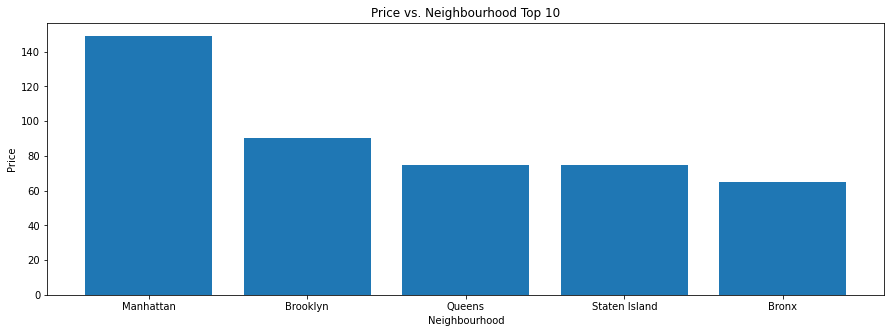

In [99]:
plt.figure(figsize=(15,5))
plt.bar(neighbor_median.index[:10],neighbor_median.iloc[:10,4]) # get first 10
plt.title('Price vs. Neighbourhood Top 10')
plt.xlabel('Neighbourhood')
plt.ylabel('Price')
plt.show()

# Part 3 Interesting Features and Correlation

The feature I choose is: Minimum nights, price, review counts, host id 

In [100]:
heatFeature = df.loc[:,['host_id','price','minimum_nights','number_of_reviews']].corr()
heatFeature # get features and their correlation

,host_id,price,minimum_nights,number_of_reviews
host_id,1.000000,0.033603,-0.018273,-0.140544
price,0.033603,1.000000,0.021425,-0.056061
minimum_nights,-0.018273,0.021425,1.000000,-0.081763
number_of_reviews,-0.140544,-0.056061,-0.081763,1.000000


<AxesSubplot:>

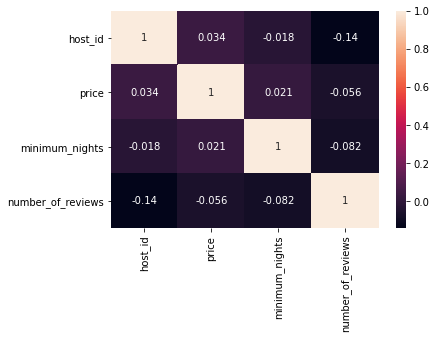

In [101]:
sns.heatmap(heatFeature,annot=True)

It seems the only thing that can be brought up here is host_id and number_of_views. In this case I treat host id as integer not unique marker. So it seems more bigger the hots id is, less view_counts the sample has. I would make a assumption that early registered host has small id number and they normally have relatively more view counts on their houses, but late register users get less view counts because they are not popular and less experienced

minimum nights and number of views are negative correlated which means people don't view it if minimum night numbers are too high. More people would like to rent for short period.

price is negative correlated with number of views. That means people don't even want to click in and read desciption of a house if the price is too high. But -0.048 is too small to make this assumption

# Part 4 Latitude and Longtitude

In [102]:
df.head() # re-check information

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,None,0.00,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


## a. Graph of Location vs. Neighbourhood

In [103]:
location = df.loc[:,['neighbourhood_group','latitude','longitude']] # get location and neighbour group
location

,neighbourhood_group,latitude,longitude
0,Brooklyn,40.64749,-73.97237
1,Manhattan,40.75362,-73.98377
2,Manhattan,40.80902,-73.94190
3,Brooklyn,40.68514,-73.95976
4,Manhattan,40.79851,-73.94399
...,...,...,...
48890,Brooklyn,40.67853,-73.94995
48891,Brooklyn,40.70184,-73.93317
48892,Manhattan,40.81475,-73.94867
48893,Manhattan,40.75751,-73.99112


In [104]:
# Change neighbourhood groups to color marks
colors = {}
cIndex = 0
for i in set(location['neighbourhood_group']):
    colors[i] = cIndex
    cIndex += 1
location['neighbourhood_group'] = location['neighbourhood_group'].map(colors)
location

,neighbourhood_group,latitude,longitude
0,4,40.64749,-73.97237
1,0,40.75362,-73.98377
2,0,40.80902,-73.94190
3,4,40.68514,-73.95976
4,0,40.79851,-73.94399
...,...,...,...
48890,4,40.67853,-73.94995
48891,4,40.70184,-73.93317
48892,0,40.81475,-73.94867
48893,0,40.75751,-73.99112


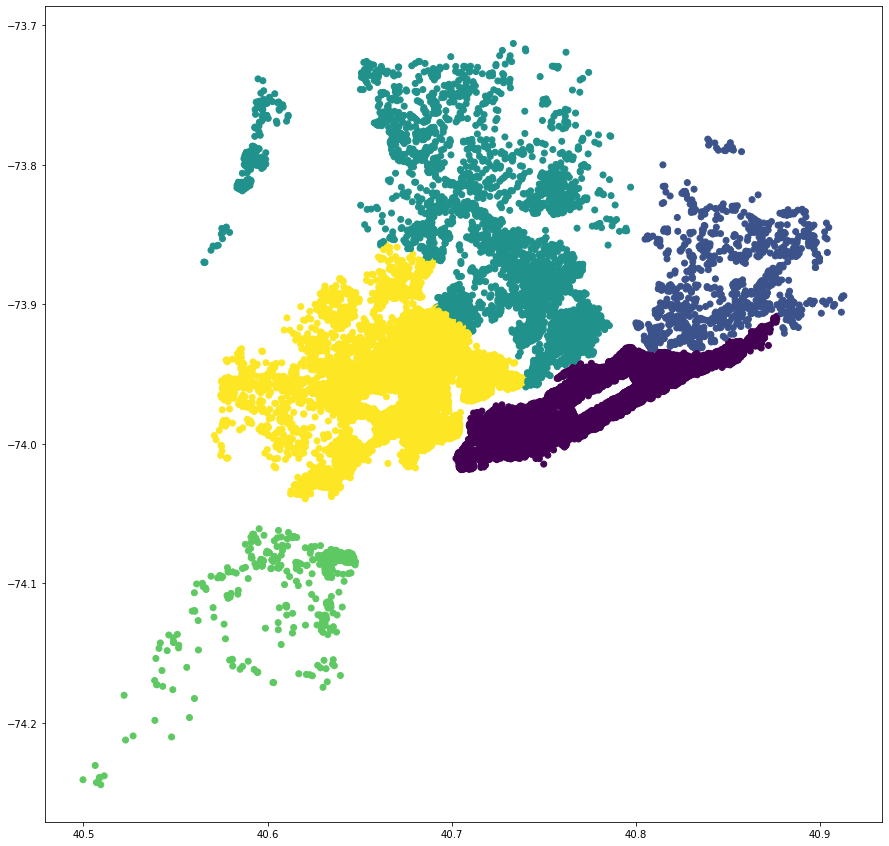

In [105]:
plt.figure(figsize=(15,15))
plt.scatter(location['latitude'],location['longitude'],c=location['neighbourhood_group'])

## b. Graph of Location vs. Price

Since we are cutting houses that less than 1000 into different colors, I would like to cut it to 4 pieces:
[0,250),[250,500),[500,750),[750,1000]

In [106]:
# form up colors by price range
price = df.loc[:,['latitude','longitude','price']]
price = price[price['price']<=1000]
#mark each range as 0-3
price.loc[price['price']<250,'price'] = 0
price.loc[(price['price']>=250)&(price['price']<500),'price'] = 1
price.loc[(price['price']>=500)&(price['price']<750),'price'] = 2
price.loc[(price['price']>=750)&(price['price']<=1000),'price'] = 3
price

,latitude,longitude,price
0,40.64749,-73.97237,0
1,40.75362,-73.98377,0
2,40.80902,-73.94190,0
3,40.68514,-73.95976,0
4,40.79851,-73.94399,0
...,...,...,...
48890,40.67853,-73.94995,0
48891,40.70184,-73.93317,0
48892,40.81475,-73.94867,0
48893,40.75751,-73.99112,0


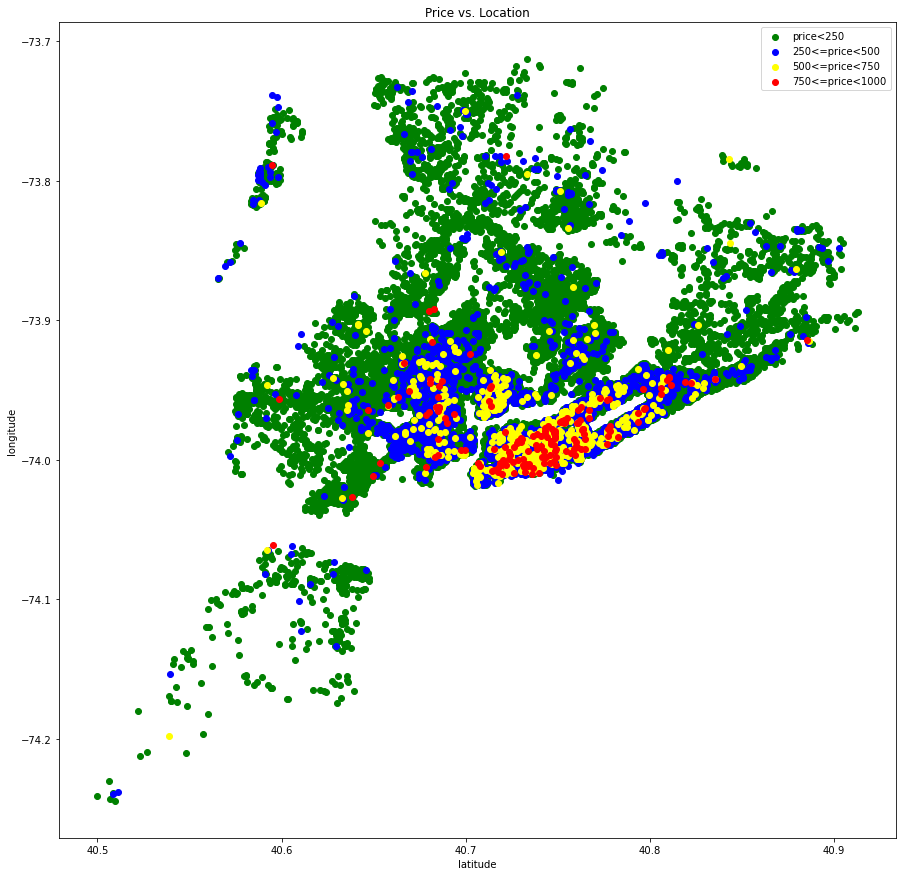

In [107]:
plt.figure(figsize=(15,15))
# make four scatter plot and label them
plt.scatter(price.loc[price['price']==0,'latitude'],price.loc[price['price']==0,'longitude'],c='green',label="price<250")
plt.scatter(price.loc[price['price']==1,'latitude'],price.loc[price['price']==1,'longitude'],c='blue',label="250<=price<500")
plt.scatter(price.loc[price['price']==2,'latitude'],price.loc[price['price']==2,'longitude'],c='yellow',label="500<=price<750")
plt.scatter(price.loc[price['price']==3,'latitude'],price.loc[price['price']==3,'longitude'],c='red',label="750<=price<1000")
plt.xlabel('latitude')
plt.ylabel('longitude')
plt.title('Price vs. Location')
plt.legend()
plt.show()

# Part 5 Word Cloud

We first collecting all the strings in this data set and put it into one string saperated with space (" ")

In [108]:
from wordcloud import WordCloud # get word cloud moduel

In [109]:
# gethering strings
strings = ' '.join([i for i in df['name']])

Now show the word cloud mapping of string

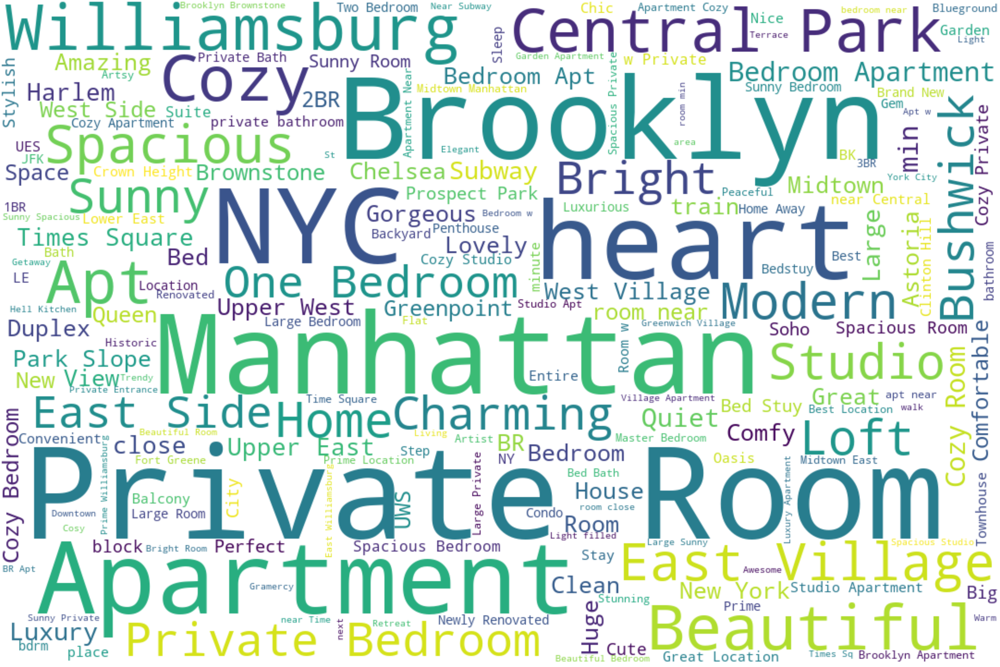

In [110]:
# generate a word cloud object
wc = WordCloud(width=1080, height=720,background_color='white').generate(text=strings)

# use plt to show it
plt.figure(figsize=(200,100))
plt.imshow(wc,interpolation='bilinear')
plt.axis('off')
plt.show()

# Part 6 Busiest Host

In [111]:
df.head() # recheck data frame

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,None,0.00,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


Two ways to approach: see how many unique host id in a neighbourhood or find mean of [price,minimum_nights,view_counts,availability]

## see how many unique id in one nightbourhood

In [112]:
 df['neighbourhood'].unique().shape # there are total of 219 neighbourhoods

(221,)

In [113]:
# we want to locate each neighbourhood out and count their unique host id numbers
aList = []
for i in list(df['neighbourhood'].unique()):
    aList.append((i,df.loc[df['neighbourhood']==i,'host_id'].unique().shape[0]))
aList.sort(key=lambda x:x[1],reverse=True)

In [114]:
aList[:5] # Williamsburg has the most unique host id

[('Williamsburg', 3360),
 ('Bedford-Stuyvesant', 2766),
 ('Harlem', 2108),
 ('Bushwick', 1889),
 ('East Village', 1607)]

The reason why I check unique host id first is because if a area's passenger flow volum is not high enough there will not be a lot of people try to rent their houses

We get top three neighbourhood and analyze their [price,minimum_nights,view_counts,availability]

In [115]:
df.loc[df['neighbourhood']=='Williamsburg',['price','minimum_nights','number_of_reviews','availability_365','reviews_per_month']].mean()

price                138.729695
minimum_nights         6.124520
number_of_reviews     21.880348
availability_365      74.541122
reviews_per_month      0.889997
dtype: float64

In [116]:
df.loc[df['neighbourhood']=='Bedford-Stuyvesant',['price','minimum_nights','number_of_reviews','availability_365','reviews_per_month']].mean()

price                100.449311
minimum_nights         5.667478
number_of_reviews     29.774263
availability_365     116.420925
reviews_per_month      1.316280
dtype: float64

In [117]:
df.loc[df['neighbourhood']=='Harlem',['price','minimum_nights','number_of_reviews','availability_365','reviews_per_month']].mean()

price                112.705971
minimum_nights         6.383220
number_of_reviews     28.653817
availability_365     106.273998
reviews_per_month      1.115431
dtype: float64

#### The most important part: Check on Google Map

We check each location on google map (This will not be show on this homework because I'm checking it on google)

### Conclusion: Williamsburg wins

Based on my research, I think Williamsburg will be the most busiest area. The reason I choose this place not only because it has most host_id in that area. On google map, we can see that Williamsburg is located right near Williamsburg bridge and Brooklyn Queens Expy (No. 278) road right accross this neighborhood. The reason why I didn't choose Bedford-Stuyvesant even though it has most view count, cheapest price and minimum nights is becuase these nformation only shows how satisfy for people to live here (spend a night). The real most busiest place will not have lowest price, view count because busiest place noramlly is not the most satisfiction place to live in.

PS: The whole hypothesis I made might be wrong because it is based on unique host_id numbers of a area. As I state above, the truly busiest place might not be the most satisfactory place to live in. Buiest neightbourhood should be a place that most of human daily activity's intersaction (way to work, go shopping, go lunch), by what I mean - Time Square

# Part 7 Interesting plots

## Plot 1

We check the correlation of price and room type

In [118]:
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,None,0.00,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


In [119]:
# see how many types of rooms are there
types = list(df['room_type'].value_counts().index)
types

['Entire home/apt', 'Private room', 'Shared room']

check relationship of room types and prices

In [120]:
typedf = df.groupby('room_type').mean()
typedf

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
room_type,,,,,,,,,,
Entire home/apt,1.844336e+07,6.170259e+07,40.728590,-73.960480,191.036275,8.449255,23.005381,1.052912,10.786694,111.016782
Private room,1.946975e+07,7.243042e+07,40.729184,-73.942838,83.539520,5.306986,24.186333,1.146182,3.230735,110.958253
Shared room,2.304390e+07,1.029310e+08,40.730345,-73.943454,65.946320,6.496970,16.666667,1.077827,4.677922,162.158442


In [121]:
df.groupby('room_type').median()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
room_type,,,,,,,,,,
Entire home/apt,18908351,24387934,40.72660,-73.96452,160,3,5,0.35,1,41
Private room,20153102,37188098,40.71769,-73.94804,70,2,5,0.40,1,45
Shared room,25464886,67567916,40.73470,-73.95073,45,1,4,0.41,2,90


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


<AxesSubplot:xlabel='room_type', ylabel='price'>

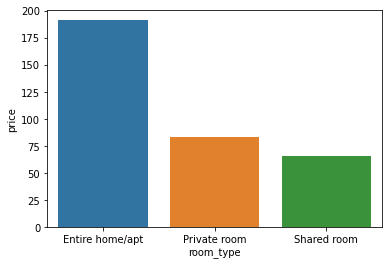

In [122]:
sns.barplot(typedf.index,typedf['price'])

From above plot we can see that whole house/appartment is the most expensive one. Private room and shared room have almost the same price

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


<AxesSubplot:xlabel='room_type', ylabel='number_of_reviews'>

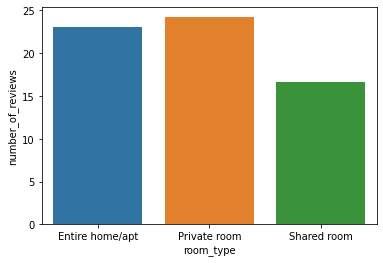

In [123]:
sns.barplot(typedf.index,typedf['number_of_reviews'])

view count of whole house renting is slitly lower than private room, because it's cheap and also can have private place. The reason why whole house can have large view number might because some people traveling in families, and it can be cheap to reant whole house by several families compare with each family renting private room. Unfortunaly we can't see this from this data set.

## Plot 2

We check correlation of all numeric features 

In [124]:
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,None,0.00,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


In [125]:
heat = df.loc[:,['id','host_id','latitude','longitude','price','minimum_nights','number_of_reviews','reviews_per_month','calculated_host_listings_count','availability_365']].corr()
heat # get all numeric features of data set

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
id,1.000000,0.587956,-0.003031,0.091423,0.023587,-0.013269,-0.321028,0.180434,0.133907,0.084618
host_id,0.587956,1.000000,0.020177,0.128521,0.033603,-0.018273,-0.140544,0.210083,0.155667,0.204955
latitude,-0.003031,0.020177,1.000000,0.085415,0.065448,0.026203,-0.015025,-0.018592,0.019548,-0.011068
longitude,0.091423,0.128521,0.085415,1.000000,-0.271091,-0.064450,0.058004,0.137920,-0.115728,0.085590
price,0.023587,0.033603,0.065448,-0.271091,1.000000,0.021425,-0.056061,-0.054178,0.144373,0.113509
minimum_nights,-0.013269,-0.018273,0.026203,-0.064450,0.021425,1.000000,-0.081763,-0.127709,0.133098,0.146084
number_of_reviews,-0.321028,-0.140544,-0.015025,0.058004,-0.056061,-0.081763,1.000000,0.588937,-0.072761,0.174270
reviews_per_month,0.180434,0.210083,-0.018592,0.137920,-0.054178,-0.127709,0.588937,1.000000,-0.047752,0.166176
calculated_host_listings_count,0.133907,0.155667,0.019548,-0.115728,0.144373,0.133098,-0.072761,-0.047752,1.000000,0.227608
availability_365,0.084618,0.204955,-0.011068,0.085590,0.113509,0.146084,0.174270,0.166176,0.227608,1.000000


Make a heatmap of above correlation

<AxesSubplot:>

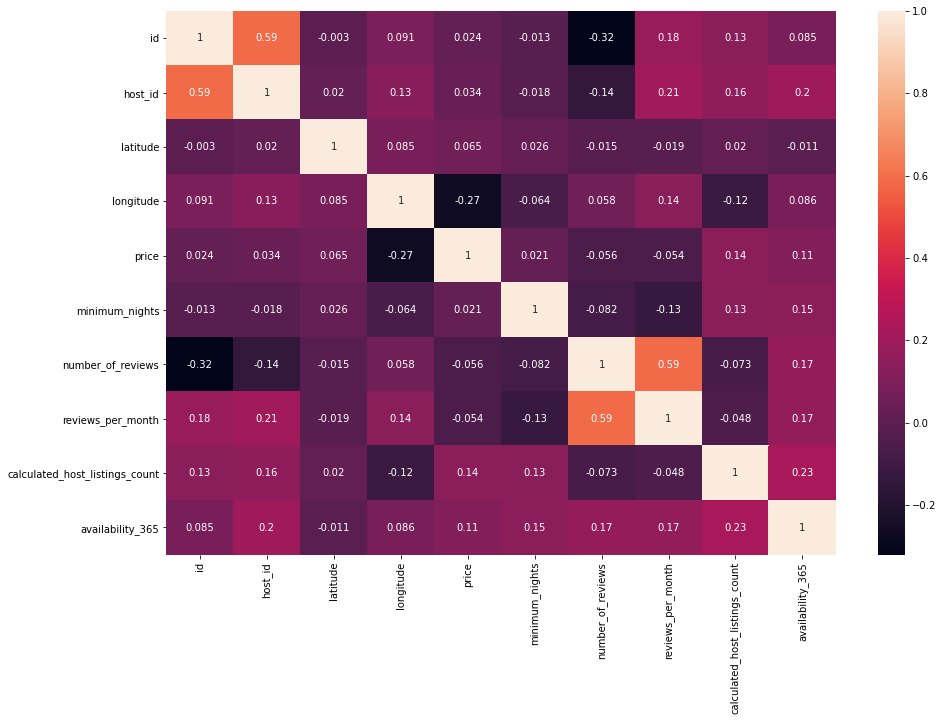

In [126]:
plt.figure(figsize=(15, 10))
sns.heatmap(heat,annot=True)

Here we have some interesting things come up.

First is id and number of views (in total). Id gets larger while view counts get smaller. As we know that if we make our rent information avalible early we will get a small id number. And all early rent information can have larger view counts. So if host want house to rent as soon as poosible, better publish information early.
PS: id and host id are the same. They are small if user register early. the reason why they have large correlation number is because early registered count publish early rent information

Second is review per month and host id have relatively large correlation. This shows that customers might perfer more experienced, older host's houses. Also review per month has relative big correlation with id, which means more early the rent information has been created more user will check on it.